In [ ]:
!curl --header "Host: doc-0k-90-docs.googleusercontent.com" --header "User-Agent: Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/83.0.4103.97 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header "Accept-Language: en-US,en;q=0.9,pa;q=0.8" --header "Referer: https://drive.google.com/" --header "Cookie: AUTH_pp0n0oquc5c2r320dooslshnqrccu9ln_nonce=nn0lmm1a8ro80; _ga=GA1.2.1131566712.1587972007" --header "Connection: keep-alive" "https://doc-0k-90-docs.googleusercontent.com/docs/securesc/kk53kko5gfgvn9rhjbblp8cfatlspjlv/c94jv4i4ik6u5osbsghkbhrpdh7ipkh1/1594104525000/00484516897554883881/03638208136195004336/1rxD15nyeIPIAZ-J2VYPrDRZI66-TBWvM?e=download&authuser=0&nonce=nn0lmm1a8ro80&user=03638208136195004336&hash=dc2d4jkb09c29l4p9b7gsmqd0rte7h9q" -L -o 'documents.rar'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 18.1M    0 18.1M    0     0  18.6M      0 --:--:-- --:--:-- --:--:-- 18.6M


In [ ]:
!pip install patool
#import patoolib
#patoolib.extract_archive("foo_bar.rar", outdir="path here")

     |████████████████████████████████| 81kB 5.1MB/s 


In [ ]:
import os
import shutil

In [ ]:
os.mkdir('documents')
os.mkdir('documents1')
os.mkdir('documents2')

In [ ]:
import patoolib

In [ ]:
patoolib.extract_archive('documents.rar', outdir='documents')

patool: Extracting documents.rar ...
patool: running /usr/bin/unrar x -- /content/documents.rar
patool:     with cwd='documents'
patool: ... documents.rar extracted to `documents'.


'documents'

In [ ]:
patoolib.extract_archive('documents.rar', outdir='documents1')

patool: Extracting documents.rar ...
patool: running /usr/bin/unrar x -- /content/documents.rar
patool:     with cwd='documents1'
patool: ... documents.rar extracted to `documents1'.


'documents1'

In [ ]:
patoolib.extract_archive('documents.rar', outdir='documents2')

patool: Extracting documents.rar ...
patool: running /usr/bin/unrar x -- /content/documents.rar
patool:     with cwd='documents2'
patool: ... documents.rar extracted to `documents2'.


'documents2'

In [ ]:
import re

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
import nltk
nltk.download('words')
nltk.download('averaged_perceptron_tagger')
nltk.download('maxent_ne_chunker')
nltk.download('punkt')

[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping chunkers/maxent_ne_chunker.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
def email_preprocessing(directory_path):
  '''This function extracts all emails for all the text files and preprocessed those'''

  files = os.listdir(directory_path) # All the text files are stored in files list
  emails = []
  for fl in files:  # We iterate through each file in list files
    f = open(directory_path + '/{}'.format(fl), 'rb') # Opening a file in byte mode
    lst = f.read().decode('ISO-8859-1')  # Converting each line into string 

    #https://stackoverflow.com/questions/42511899/python-script-to-extract-emails-from-text-file
    #https://www.geeksforgeeks.org/extracting-email-addresses-using-regular-expressions-python/
    
    match = re.findall(r'\S+@[\w\.-]+', lst) # Finding all the email addresses in the file
    emails.append(match)  # Appending all the email addresses of a file in the list emails
    f.close()

  pattern = '@'
  emails_after_at = []  # All the strings after '@' are collected and stored in this list
  for email in emails:  
    temp = []
    for txt in email:
      match = re.search(pattern, txt)
      s = match.start()
      temp.append(txt[s+1:])
    emails_after_at.append(temp)
 
  # After getting all the strings after '@', we observed that there is still some string having '@' in them and some do not have '.' in 
  # them.Since an email address can have only one '@' and it should have atleast one '.' and the strings in the list 'emails_after_at'
  # having '@' and not having any '.' are not part of valid email addresses and we have to remove them.
  for email in emails_after_at:
    temp = set()
    for eml in email:
      if '@' in eml:
        temp.add(eml)
      if '.' not in eml:
        temp.add(eml)
    for eml in list(temp):
      email.remove(eml)

  preprocessed_emails = [] # This list will contain all the final strings of the valid email addresses after '@'
  for lst in emails_after_at:
    temp = []
    for email in lst:
      for ele in email.split('.'):
        if len(ele) > 2 and ele != 'com': # If the length of a string is greater than 2 and it is not 'com', only then we are keeping it in the final list
          temp.append(ele)
    preprocessed_emails.append(' '.join(temp))

  # In the following block of codes we are replacing all the email addresses in the original file by space
  index = 0
  for fl in files: # We iterate through each file
    f = open(directory_path + '/{}'.format(fl), 'rb')
    lines = f.readlines() # Reading all the lines in a file
    f.close()
    temp = []
    for line in lines: # Iterating through each line of a text file
      line = line.decode('ISO-8859-1') # Converting a line into string from byte
      for email in emails[index]:  # Getting all the email addresses of the current file
        if email in line:
          line = line.replace(email, ' ')  #Replacing the email addresse(s) in a line by space(s) 
      temp.append(line)
    f = open(directory_path + '/{}'.format(fl), 'w')
    for line in temp:
      f.write(line)
    f.close()
    index += 1

  return (np.array(preprocessed_emails))

In [ ]:
def subject_preprocessing(directory_path):
  '''This function extracts subjects from the text files and preprocessed those'''

  preprocessed_subjects = []
  patterns = [r'\w*:', r'\W+', r'\s+']
  files = os.listdir(directory_path)
  for fl in files:
    f = open(directory_path + '/{}'.format(fl), 'r')
    lines = f.readlines()
    f.close()
    temp = []
    for i in range(len(lines)):
      if ('Subject:' in lines[i] and i == 0) or ('Subject:' in lines[i] and i == 1): # Getting subject of the text, we observed that subject could be in line no 1 or 0
        line = lines[i]
        for pattern in patterns:
          for match in re.findall(pattern, line):
            if match != ' ':
              line = line.replace(match, ' ')
        preprocessed_subjects.append(line)
      else:
       temp.append(lines[i])
    f = open(directory_path + '/{}'.format(fl), 'w')
    for line in temp:
      f.write(line)
    f.close()

  return(np.array(preprocessed_subjects))

In [ ]:
# https://stackoverflow.com/a/47091490/4084039
def decontracted(phrase):
  # specific
  phrase = re.sub(r"won't", "will not", phrase)
  phrase = re.sub(r"can\'t", "can not", phrase)

  # general
  phrase = re.sub(r"n\'t", " not", phrase)
  phrase = re.sub(r"\'re", " are", phrase)
  phrase = re.sub(r"\'s", " is", phrase)
  phrase = re.sub(r"\'d", " would", phrase)
  phrase = re.sub(r"\'ll", " will", phrase)
  phrase = re.sub(r"\'t", " not", phrase)
  phrase = re.sub(r"\'ve", " have", phrase)
  phrase = re.sub(r"\'m", " am", phrase)
    
  return phrase

In [ ]:
def removing_person_name_and_combining_entity_having_a_space_between_words(directory_path):
  ''' This function removes person names from a text file'''

  files = os.listdir(directory_path)
  for fl in files:
    f = open(directory_path + '/{}'.format(fl))
    line = f.read()
    temp = line
    f.close()
    lst = []
  #https://stackoverflow.com/questions/31836058/nltk-named-entity-recognition-to-a-python-list
    for sent in nltk.sent_tokenize(temp):
      for chunk in nltk.ne_chunk(nltk.pos_tag(nltk.word_tokenize(sent))):
        if hasattr(chunk, 'label'):
          lst.append((chunk.label(), ' '.join(c[0] for c in chunk)))
    person_name = []   # It contains person names in the text file
    not_person_name = [] # It contains GPE, Organization names etc in the text file
    for ele in lst:
      if ele[0] == 'PERSON':
        person_name.append(ele[1])
      else:
        not_person_name.append(ele[1])
    for person in person_name:
      line = line.replace(person, ' ')  # Removing person names from the file
    temp = []
    for ele in not_person_name:
      if len(ele.split()) == 2:    # Checking whether an entiX_test_sequences = t.texts_to_sequences(X_test)ty has two words with space in between the words
        temp.append('_'.join(ele.split())) # Joining an entity of two words having a space in between the words with '_' 
      else:
        temp.append(ele)
    for ele in zip(not_person_name, temp):
      line = line.replace(ele[0], ele[1])  # Replacing all the not person name entities with the modified form of words
    f = open(directory_path +'/{}'.format(fl), 'w')
    f.write(line)
    f.close()

In [ ]:
def text_preprocessing(directory_path):
  '''This function preprocessed texts of all text files'''

  files = os.listdir(directory_path)
  for i in range(len(files)):
    fl = open(directory_path + '/{}'.format(files[i]))
    temp = []
    lines = fl.readlines()
    fl.close()
    for line in lines:  # Iterating through each line of a text file
      if re.search(r'\AFrom:', line):  # Checking whether a line start with "From:"
        pass
      elif re.search(r'\AWrite to:', line): # Checking whether a line start with "Write to:"
        pass
      else:
        temp.append(line)  # temp contains all lines which do not start with "From:" or "Write to:"
    fl = open(directory_path + '/{}'.format(files[i]), 'w')
    for line in temp:
      fl.write(line)
    fl.close()

  #https://stackoverflow.com/questions/45671624/replace-text-between-parentheses-in-python
  files = os.listdir(directory_path)
  patterns = ['<.*>','<', '>', '-', r'\\', r'[\w*\W*\w*]*:', r'\(.*\)', r'\s+']
  for i in range(len(files)):
    fl = open(directory_path + '/{}'.format(files[i]))
    temp = []
    lines = fl.readlines()
    fl.close()
    for line in lines:  # Iterating through each line of a text file
      for pattern in patterns: # Iterating through each pattern in the list patternsi
        for match in re.findall(pattern,line): # Finding all the substrings in the line for a pattiern and iterating through each substring
          line = line.replace(match, ' ')
      temp.append(decontracted(line))  # Replacing short form of a word with its full form
    f = open(directory_path + '/{}'.format(files[i]), 'w')
    for line in temp:
      f.write(line)
    f.close()
  removing_person_name_and_combining_entity_having_a_space_between_words(directory_path)
  
  preprocessed_texts = []
  files = os.listdir(directory_path)
  for fl in files:
    f = open(directory_path + '/{}'.format(fl))
    line = f.read()
    f.close()
    temp = []
    for match in re.findall(r'\d+', line): # Finding all the substrings of sequence of digits in the line  and iterating through each substring
      line = line.replace(match, ' ')  # Replacing sequence of digits with space
    for word in line.split():
      if re.search(r'\A_', word):    # Checking for "_word" type of word
        word = word[1:]
      if re.search(r'\Z_', word):   # Checking for "word_" type of word
        word = word[0:-1]
      count = 0
      temp_word = []
      for ele in word.split('_'):  # After the end of this  loop we will not have "OneLetter_word"- eg: d_berlin, and "TwoLetters_word" - eg: dr_berlin type of word
        if len(ele) > 2:
          temp_word.append(ele)
          count += 1
      if count == 2:
        temp.append('_'.join(temp_word))
      elif count == 1:
        temp.append(temp_word[0])
    line = ' '.join(temp)
    line = line.lower() # Converting into lower case 
    temp = []
    for word in line.split():
      if len(word) < 15:  # Checking whether length is less than 15
        temp.append(word)
    line = ' '.join(temp)
    for match in re.findall('[^a-z_]', line): # Finding all the substrings in the line except ^a-z_ type expression and iterating through each substring
      line = line.replace(match, ' ')  # Replacing each matched substring with space
    preprocessed_texts.append(line)
    f = open(directory_path + '/{}'.format(fl), 'w')
    f.write(line)
    f.close()
  
  return (np.array(preprocessed_texts))

In [ ]:
def preprocess(directory_path):
  '''This fuction perfoms preprocessing on emails, subjects and texts of a text file'''
  
  emails = email_preprocessing(directory_path)
  subjects = subject_preprocessing(directory_path)
  texts = text_preprocessing(directory_path)

  return (texts, subjects, emails)

In [ ]:
directory_path = 'documents/documents'
text = []
files = os.listdir(directory_path)
for fl in files:
  temp = []
  f = open(directory_path + '/{}'.format(fl), 'rb')
  lines = f.readlines()
  f.close()
  for line in lines:
    temp.append(line.decode('ISO-8859-1'))
  text.append(temp)
text = np.array(text) # Getting all the texts in text files into the list 'text'

class_label = []
for fl in files:
  index = -1
  for ele in fl:
    index += 1
    if ele == '_':
      break
  class_label.append(fl[:index])  # Getting class labels
class_label = np.array(class_label)

preprocessed_text, preprocessed_subject, preprocessed_email = preprocess(directory_path)

# Creating data frame
data = pd.DataFrame({
    'text' : text,
    'class' : class_label,
    'preprocessed_text' : preprocessed_text,
    'preprocessed_subject' : preprocessed_subject,
    'preprocessed_email' : preprocessed_email
})

In [ ]:
data.columns

Index(['text', 'class', 'preprocessed_text', 'preprocessed_subject',
       'preprocessed_email'],
      dtype='object')

In [ ]:
data.iloc[0]

text                    [From: scott@asd.com (Scott Barman)\n, Subject...
class                                                  rec.sport.baseball
preprocessed_text       just wondering  friend and were talking the ot...
preprocessed_subject                             Jewish Baseball Players 
preprocessed_email      asd lafibm lafayette edu lafibm lafayette edu ...
Name: 0, dtype: object

In [ ]:
data.iloc[1]

text                    [From: hasan@McRCIM.McGill.EDU \n, Subject: Re...
class                                               talk.politics.mideast
preprocessed_text       get the impression realized goofed and now try...
preprocessed_subject                       18 Israelis murdered in March 
preprocessed_email      McRCIM McGill EDU frej teknikum frej teknikum ...
Name: 1, dtype: object

In [ ]:
data.iloc[3456]

text                    [From: punjabi@leland.Stanford.EDU (sanjeev pu...
class                                                  rec.sport.baseball
preprocessed_text       the heading indicates  impossible for fathom w...
preprocessed_subject                  Why is Barry Bonds not batting 4th 
preprocessed_email                                    leland Stanford EDU
Name: 3456, dtype: object

In [ ]:
data.iloc[33]['preprocessed_text']

'believe not  have phone books  but the current information does not include area code for would not hostile towards others for asking simple questions    would rather appear stupid than open moutha remove all doubt   twain  if you assult someone you get years hockey  minutes  this great sport what    frank'

In [ ]:
# Getting unique class labels
unique_class_label = set()
for ele in class_label:
  unique_class_label.add(ele)

In [ ]:
labels = []
lst = list(zip(unique_class_label, range(0, 20)))
for label in class_label:
  for ele in lst:
    if ele[0] == label:
      labels.append(ele[1])

In [ ]:
data_merge = pd.DataFrame({
    'class' : labels,
    'text_subject_email': data['preprocessed_text'] + data['preprocessed_subject'] + data['preprocessed_email']
})

In [ ]:
from google.colab import drive
drive.mount('drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at drive


In [ ]:
# Getting preprocessed data from my google drive.I have saved it in my google drive after preprocessing, because preprocessing is time 
# consuming but we can compute it from the above code. 
data_merge = pd.read_csv('drive/My Drive/Document_CNN/preprocessed_data.csv')

In [ ]:
classes = set(data_merge['class'])
nb_classes = len(classes)

In [ ]:
nb_classes

20

In [ ]:
data_merge

,class,text_subject_email
0,11,article article are you suggesting that when ...
1,15,what s new friday april washington ...
2,13,looking for information how uses Proteced Mode...
3,12,greetings have sets plugs for your oscillosco...
4,2,well the points out the full force the anti ...
...,...,...
18823,6,any government that allows tinpot dictators se...
18824,6,looks like the branch out buisness this morni...
18825,3,believe many people will happy have this infor...
18826,12,thule rack with bike holder accessories comes...


In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
import tensorflow as tf

In [ ]:
# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(data_merge['text_subject_email'], data_merge['class'], stratify = data_merge['class'], random_state=42)

In [ ]:
print(X_train.shape)

(14121,)


# Mode_1

In [ ]:
# Tokenizing text data
t = tf.keras.preprocessing.text.Tokenizer(filters='!"#$%&()*+,-./:;<=>?@[\\]^`{|}~\t\n')
t.fit_on_texts(X_train)

In [ ]:
# Text to sequences for the train data
X_train_sequences = t.texts_to_sequences(X_train)

In [ ]:
# Text to sequences for the test data
X_test_sequences = t.texts_to_sequences(X_test)

In [ ]:
print(len(X_train))

14121


In [ ]:
print(len(X_train_sequences[0]))

150


In [ ]:
temp = []
for ele in X_train_sequences:
  temp.append(len(ele))

In [ ]:
temp.sort()
max_sequence_len=temp[-1]

In [ ]:
# Padding the train data
X_train_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_train_sequences, padding='post')

In [ ]:
print(X_train_sequences_padded.shape)

(14121, 11616)


In [ ]:
print(X_train_sequences_padded[0])

[ 86  44 393 ...   0   0   0]


In [ ]:
temp1 = []
for ele in X_train_sequences_padded:
  temp1.append(len(ele))
print(temp1)

[11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616, 11616

In [ ]:
# Padding the test data
X_test_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_test_sequences, maxlen = max_sequence_len, padding='post')

In [ ]:
# Converting class labels into one hot encoding
Y_train = tf.keras.utils.to_categorical(y_train, nb_classes)
Y_test = tf.keras.utils.to_categorical(y_test, nb_classes)

In [ ]:
vocab_size = len(t.word_index) + 1
print(vocab_size)

73578


In [ ]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
embeddings_index = dict()
# https://nlp.stanford.edu/projects/glove/
f = open('drive/My Drive/Document_CNN/glove.6B.300d.txt') # Here I am getting the file from my google drive, please download the file from the above link
coefs = []
for line in f:
  values = line.split()
  word = values[0]
  coefs = np.asarray(values[1:], dtype='float32')
  embeddings_index[word] = coefs
f.close()
# create a weight matrix for words in training data
embedding_matrix = np.zeros((vocab_size, 300))
for word, i in t.word_index.items():
	embedding_vector = embeddings_index.get(word)
	if embedding_vector is not None:
		embedding_matrix[i] = embedding_vector

In [ ]:
embedding_matrix.shape

(73578, 300)

In [ ]:
print(t.word_counts)

OrderedDict([('want', 3025), ('get', 6074), ('color', 844), ('not', 40485), ('care', 845), ('what', 12066), ('but', 16101), ('machine', 868), ('would', 13847), ('prefer', 238), ('trade', 345), ('present', 452), ('system', 2951), ('plus', 468), ('some', 7967), ('cash', 84), ('other', 6133), ('equipment', 349), ('for', 32930), ('the', 174040), ('right', 3337), ('now', 3830), ('full', 968), ('buy', 902), ('outright', 40), ('here', 2971), ('has', 9232), ('with', 21045), ('internal', 318), ('drive', 1792), ('meg', 269), ('external', 241), ('imagewriter', 23), ('ribbon', 24), ('stuff', 937), ('that', 48373), ('can', 13636), ('it', 6389), ('willing', 481), ('include', 699), ('both', 2108), ('modems', 110), ('and', 69484), ('baud', 85), ('modem', 447), ('deal', 630), ('keep', 1285), ('mind', 801), ('are', 24962), ('less', 1190), ('than', 5801), ('month', 325), ('old', 1312), ('multitech', 4), ('sells', 97), ('about', 9865), ('so', 1680), ('u', 1760), ('s', 3675), ('robotics', 23), ('sportster'

In [ ]:
print(t.document_count)
print(t.word_index)
print(t.word_docs)

14121
{'the': 1, 'and': 2, 'that': 3, 'not': 4, 'for': 5, 'you': 6, 'have': 7, 'are': 8, 'this': 9, 'ax': 10, 'with': 11, 'edu': 12, 'was': 13, 'they': 14, 'but': 15, 'would': 16, 'can': 17, 'will': 18, 'from': 19, 'what': 20, 'there': 21, 'all': 22, 'one': 23, 'about': 24, 'has': 25, 'your': 26, 'any': 27, 'who': 28, 'some': 29, 'out': 30, 'were': 31, 'which': 32, 'people': 33, 'more': 34, 'when': 35, 'like': 36, 'does': 37, 'their': 38, 'just': 39, 'it': 40, 'know': 41, 'how': 42, 'other': 43, 'get': 44, 'had': 45, 'only': 46, 'them': 47, 'than': 48, 'been': 49, 'his': 50, 'think': 51, 'also': 52, 'use': 53, 'could': 54, 'then': 55, 'time': 56, 'did': 57, 'should': 58, 'these': 59, 'good': 60, 'well': 61, 'because': 62, 'even': 63, 'why': 64, 'now': 65, 'into': 66, 'very': 67, 'may': 68, 's': 69, 'way': 70, 'much': 71, 'see': 72, 'many': 73, 'make': 74, 'new': 75, 'those': 76, 'two': 77, 'first': 78, 'most': 79, 'right': 80, 'such': 81, 'say': 82, 'where': 83, 'our': 84, 'anyone': 85

In [ ]:
import datetime

In [ ]:
from tensorflow.keras import layers

In [ ]:
import sklearn

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
input_model = tf.keras.Input(shape=(max_sequence_len,), name='input')
e = layers.Embedding(vocab_size, 300, weights=[embedding_matrix], input_length = max_sequence_len, trainable=False, name='embedding_layer')(input_model)
conv_layer_1 = layers.Conv1D(12, 2, activation = 'relu', kernel_initializer='he_normal', name='conv_layer_1')(e)
conv_layer_2 = layers.Conv1D(12, 2, activation='relu', kernel_initializer='he_normal', name='conv_layer_2')(e)
conv_layer_3 = layers.Conv1D(12, 2, activation='relu', kernel_initializer='he_normal', name='conv_layer_3')(e)

concat_layer = layers.concatenate(inputs=[conv_layer_1, conv_layer_2, conv_layer_3], name='concat_1')
max_pool_layer = layers.MaxPool1D(pool_size=2, name='max_pool_layer_1')(concat_layer)

conv_layer_4 = layers.Conv1D(12, 2, activation = 'relu', kernel_initializer='he_normal', name='conv_layer_4')(max_pool_layer)
conv_layer_5 = layers.Conv1D(12, 2, activation='relu', kernel_initializer='he_normal', name='conv_layer_5')(max_pool_layer)
conv_layer_6 = layers.Conv1D(12, 2, activation = 'relu', kernel_initializer='he_normal', name='conv_layer_6')(max_pool_layer)
concat_layer = layers.concatenate(inputs=[conv_layer_4, conv_layer_5, conv_layer_6], name='concat_2')
max_pool_layer = layers.MaxPool1D(pool_size=2, name='max_pool_layer_2')(concat_layer)

conv_layer = layers.Conv1D(12, 2, activation = 'relu', kernel_initializer='he_normal', name='conv_layer_7')(max_pool_layer)
flatten = layers.Flatten()(conv_layer)
dropout = layers.Dropout(0.5)(flatten)
dense_layer = layers.Dense(units=500, activation='relu', kernel_initializer='he_normal', name='dense_layer')(dropout)
output = layers.Dense(units=20, activation='softmax', kernel_initializer='he_normal', name='output_layer')(dense_layer)

model = tf.keras.Model(inputs=input_model, outputs=output)

In [ ]:
class F1_Score(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    '''This function calculate F1 score after each epoch'''

    train_predicted = model.predict(X_train_sequences_padded)  # Predicting classes for training dataset
    train_predicted_class = []
    for ele in train_predicted:
      train_predicted_class.append(np.argmax(ele))
    train_predicted_class = np.array(train_predicted_class)
    train_actual_class = np.array(y_train)     # Getting actual class label for training dataset
    F1_score_train = sklearn.metrics.f1_score(train_actual_class, train_predicted_class, average='micro')  # Calculating F1 score of the model for training dataset
    print('\nF1 score for training dataset =', F1_score_train) 
    
    test_predicted = model.predict(X_test_sequences_padded)  # Predicting classes for test dataset
    test_predicted_class = []
    for ele in test_predicted:
      test_predicted_class.append(np.argmax(ele))
    test_predicted_class = np.array(test_predicted_class)
    test_actual_class = np.array(y_test)    # Getting actual class label for test dataset
    F1_score_test = sklearn.metrics.f1_score(test_actual_class, test_predicted_class, average='micro') # Calculating F1 score of the model for test d
    print('\nF1 score for test dataset =', F1_score_test)

In [ ]:
%load_ext tensorboard

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
os.mkdir('model_save')

In [ ]:
filepath = 'model_save/best_model_1.h5'
F1 = F1_Score()
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=filepath, monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=True, mode='max')
earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.01, patience=2, verbose=1)
log_dir="logs/model_1/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True, write_grads=True) 

callback_list = [F1, earlystop, checkpoint, tensorboard_callback]
model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_sequences_padded, Y_train, epochs=8, batch_size=32, validation_data=(X_test_sequences_padded,Y_test), callbacks=callback_list)

Epoch 1/8
441/442 [============================>.] - ETA: 0s - loss: 2.1318 - accuracy: 0.2954
F1 score for training dataset = 0.56192904185256

F1 score for test dataset = 0.515190142341194

Epoch 00001: val_accuracy improved from -inf to 0.51519, saving model to model_save/best_model_1.h5
442/442 [==============================] - 139s 315ms/step - loss: 2.1315 - accuracy: 0.2954 - val_loss: 1.4774 - val_accuracy: 0.5152
Epoch 2/8
441/442 [============================>.] - ETA: 0s - loss: 1.3469 - accuracy: 0.5286
F1 score for training dataset = 0.6677289143828341

F1 score for test dataset = 0.6001699596345867

Epoch 00002: val_accuracy improved from 0.51519 to 0.60017, saving model to model_save/best_model_1.h5
442/442 [==============================] - 138s 313ms/step - loss: 1.3470 - accuracy: 0.5285 - val_loss: 1.2013 - val_accuracy: 0.6002
Epoch 3/8
441/442 [============================>.] - ETA: 0s - loss: 1.1188 - accuracy: 0.6034
F1 score for training dataset = 0.73089724523

In [ ]:
%tensorboard --logdir logs/model_1

<IPython.core.display.Javascript object>

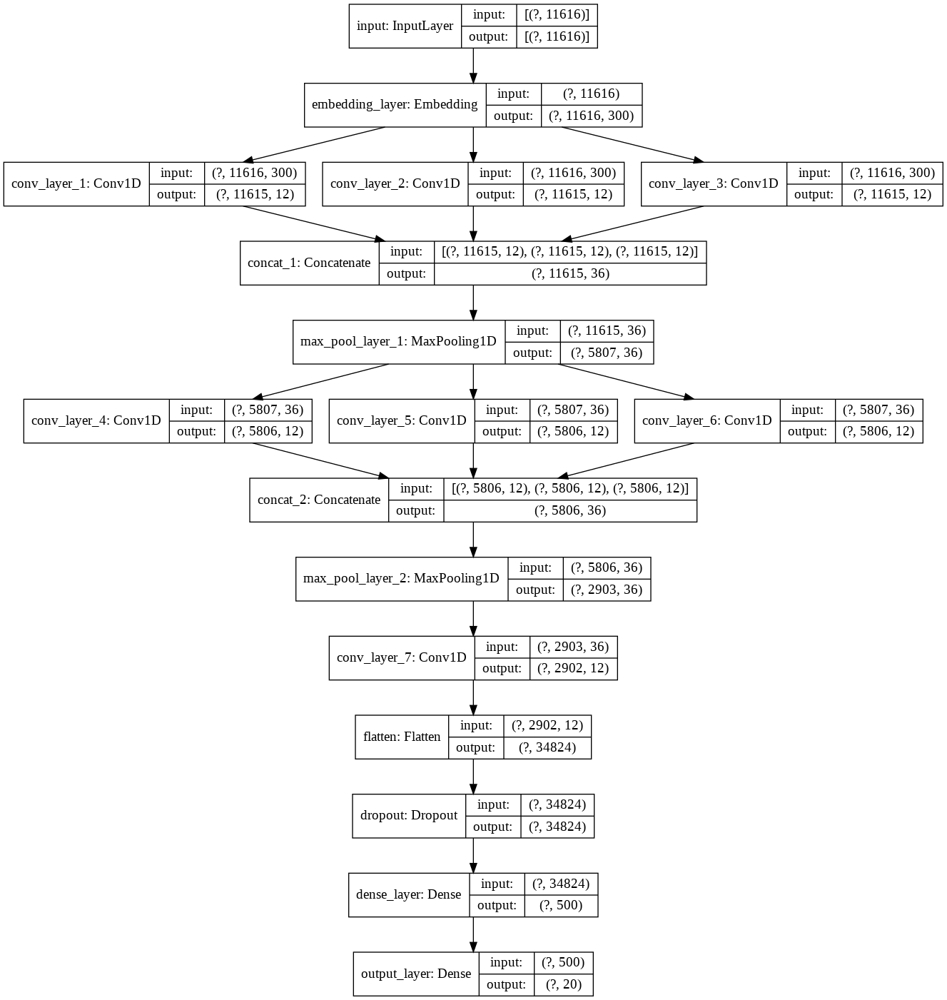

In [ ]:
tf.keras.utils.plot_model(
    model, to_file='model_1.png', show_shapes=True, show_layer_names=True,
    rankdir='TB', expand_nested=False, dpi=96
)

## Some screenshot of histograms of  model 1

<a href='https://drive.google.com/file/d/1wAGJaYoZ7unIVM6Xdm2HH8LuvEaav3uk/view?usp=sharing'>screenshot_1</a>

<a href='https://drive.google.com/file/d/1uC5zrmjo8rcnRhDNKTY3vVFlGiHBcY2m/view?usp=sharing'>screenshot_2</a>

<a href='https://drive.google.com/file/d/1NQcSxlFTfvO1S4IIjnD4wjd3VpjBnzxp/view?usp=sharing'>screenshot_3</a>

<a href='https://drive.google.com/file/d/1-OV2doedZJG3IM6zJKc7z6D_XvS6M-T4/view?usp=sharing'>screenshot_4</a>


## Screenshots of the scalars of model 1

<a href='https://drive.google.com/file/d/1t8GyKJF9Lwj17ZcA9mGDuWLwZ69rTEiH/view?usp=sharing'>Epoch_Accuracy</a>

<a href='https://drive.google.com/file/d/1c4ERlaO-mYgbzSZaSN0FTrLU1tVBXsCW/view?usp=sharing'>Epoch_Loss</a>

# Model_2

In [ ]:
# https://towardsdatascience.com/how-to-preprocess-character-level-text-with-keras-349065121089
# Initialization
tk = tf.keras.preprocessing.text.Tokenizer(num_words=None, char_level=True, oov_token='UNK')
# Fitting
tk.fit_on_texts(X_train)

In [ ]:
# List the vocabulary
tk.word_index

{'\n': 60,
 ' ': 2,
 '!': 43,
 '"': 45,
 '#': 54,
 '$': 48,
 '%': 64,
 '&': 49,
 "'": 59,
 '(': 41,
 ')': 47,
 '*': 52,
 '+': 50,
 ',': 56,
 '-': 33,
 '.': 42,
 '/': 58,
 '0': 31,
 '1': 30,
 '2': 32,
 '3': 34,
 '4': 35,
 '5': 37,
 '6': 36,
 '7': 40,
 '8': 38,
 '9': 39,
 ';': 61,
 '<': 65,
 '>': 51,
 '?': 44,
 '@': 46,
 'UNK': 1,
 '[': 57,
 ']': 55,
 '^': 62,
 '_': 29,
 '`': 53,
 'a': 5,
 'b': 22,
 'c': 14,
 'd': 13,
 'e': 3,
 'f': 21,
 'g': 18,
 'h': 11,
 'i': 8,
 'j': 26,
 'k': 24,
 'l': 12,
 'm': 16,
 'n': 7,
 'o': 6,
 'p': 17,
 'q': 27,
 'r': 10,
 's': 9,
 't': 4,
 'u': 15,
 'v': 23,
 'w': 19,
 'x': 25,
 'y': 20,
 'z': 28,
 '{': 63}

In [ ]:
# https://towardsdatascience.com/how-to-preprocess-character-level-text-with-keras-349065121089
alphabet="abcdefghijklmnopqrstuvwxyz_"
char_dict = {}
for i, char in enumerate(alphabet):
    char_dict[char] = i + 1
char_dict

{'_': 27,
 'a': 1,
 'b': 2,
 'c': 3,
 'd': 4,
 'e': 5,
 'f': 6,
 'g': 7,
 'h': 8,
 'i': 9,
 'j': 10,
 'k': 11,
 'l': 12,
 'm': 13,
 'n': 14,
 'o': 15,
 'p': 16,
 'q': 17,
 'r': 18,
 's': 19,
 't': 20,
 'u': 21,
 'v': 22,
 'w': 23,
 'x': 24,
 'y': 25,
 'z': 26}

In [ ]:
# https://towardsdatascience.com/how-to-preprocess-character-level-text-with-keras-349065121089
# Use char_dict to replace the tk.word_index
tk.word_index = char_dict 
# Add 'UNK' to the vocabulary 
tk.word_index[tk.oov_token] = max(char_dict.values()) + 1

In [ ]:
train_sequences = tk.texts_to_sequences(X_train)
print(X_train[0])
print(len(X_train[0]))
print(len(train_sequences[0]))
print(train_sequences[0])

article article are you suggesting that  when guerillas use the population for cover  israel should totally back down  so   the easiest way get away with attacking another use innocent shield and hope that the other respects innocent lives  tell what are these guerillas doing wrong  assuming that they are using civilians for cover  come on  are going get anywhere this discussion  does not help bring elements never addressed   nor commented any way   made comment who  right  who  wrong   only that civilians are being used cover and that  having been placed  in between  the israelis and the guerillas  they  will  injured both parties continue their fight  pardon but not see how can possible for the idf fail detect the presence those responsible for planting the bomb which killed the three idf troops and then later know the exact number and whereabouts all them  several villages were shelled  how could the idf possibly have known that there were guerrillas each the targetted villages  you

In [ ]:
# Getting pretrained character embedding vector from https://codeload.github.com/minimaxir/char-embeddings/zip/master
!curl --header "Host: codeload.github.com" --header "User-Agent: Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/83.0.4103.97 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header "Accept-Language: en-US,en;q=0.9,pa;q=0.8" --header "Cookie: _octo=GH1.1.1592281951.1571048053; logged_in=no; _ga=GA1.2.600288352.1571048062" --header "Connection: keep-alive" "https://codeload.github.com/minimaxir/char-embeddings/zip/master" -L -o 'char-embeddings-master.zip'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 10.9M    0 10.9M    0     0  9420k      0 --:--:--  0:00:01 --:--:-- 9420k


In [ ]:
!unzip char-embeddings-master.zip

Archive:  char-embeddings-master.zip
860c92a0af3b13c525c33d7257ef0204aaf80e1c
   creating: char-embeddings-master/
 extracting: char-embeddings-master/.gitignore  
  inflating: char-embeddings-master/LICENSE  
  inflating: char-embeddings-master/README.md  
  inflating: char-embeddings-master/char-tsne-embed.png  
  inflating: char-embeddings-master/create_embeddings.py  
  inflating: char-embeddings-master/create_magic_text.py  
  inflating: char-embeddings-master/glove.840B.300d-char.txt  
  inflating: char-embeddings-master/magic_cards.txt  
  inflating: char-embeddings-master/model.png  
   creating: char-embeddings-master/output/
  inflating: char-embeddings-master/output/char-embeddings.txt  
  inflating: char-embeddings-master/output/iter-01-0_9204.txt  
  inflating: char-embeddings-master/output/iter-02-0_6075.txt  
  inflating: char-embeddings-master/output/iter-03-0_5305.txt  
  inflating: char-embeddings-master/output/iter-04-0_4860.txt  
  inflating: char-embeddings-master/

In [ ]:
X_train = X_train.values
X_test = X_test.values

In [ ]:
X_train_sequences = tk.texts_to_sequences(X_train)
X_test_sequences = tk.texts_to_sequences(X_test)

In [ ]:
temp = []
for ele in X_train_sequences:
  temp.append(len(ele))

In [ ]:
temp.sort()
max_sequence_len=temp[-1]

In [ ]:
# Padding train data
X_train_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_train_sequences, padding='post')
# Padding the test data
X_test_sequences_padded = tf.keras.preprocessing.sequence.pad_sequences(X_test_sequences, maxlen = max_sequence_len, padding='post')

In [ ]:
vocab_size = len(tk.word_index) + 1
print(vocab_size)

29


In [ ]:
print(tk.word_index)

{'a': 1, 'b': 2, 'c': 3, 'd': 4, 'e': 5, 'f': 6, 'g': 7, 'h': 8, 'i': 9, 'j': 10, 'k': 11, 'l': 12, 'm': 13, 'n': 14, 'o': 15, 'p': 16, 'q': 17, 'r': 18, 's': 19, 't': 20, 'u': 21, 'v': 22, 'w': 23, 'x': 24, 'y': 25, 'z': 26, '_': 27, 'UNK': 28}


In [ ]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
embeddings_index = dict()
f = open('char-embeddings-master/glove.840B.300d-char.txt')
coefs = []
for line in f:
  values = line.split()
  ch = values[0]
  coefs = np.asarray(values[1:], dtype='float32')
  embeddings_index[ch] = coefs
f.close()
# create a weight matrix for words in training data
embedding_matrix = np.zeros((vocab_size, 300))
for ch, i in tk.word_index.items():
	embedding_vector = embeddings_index.get(ch)
	if embedding_vector is not None:
		embedding_matrix[i] = embedding_vector

In [ ]:
print(embedding_matrix.shape)

(29, 300)


In [ ]:
# Converting class labels into one hot encoding
Y_train = tf.keras.utils.to_categorical(y_train, nb_classes)
Y_test = tf.keras.utils.to_categorical(y_test, nb_classes)

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
model_2_input = tf.keras.Input(shape=(max_sequence_len,), name='model_2_input')
e = layers.Embedding(vocab_size, 300, weights=[embedding_matrix], input_length = max_sequence_len, trainable=False, name='model_2_embedding_layer')(model_2_input)

conv_layer_1 = layers.Conv1D(16, 4, activation = 'relu', kernel_initializer='he_normal', name='model_2_conv_layer_1')(e)
conv_layer_2 = layers.Conv1D(16, 4, activation='relu', kernel_initializer='he_normal', name='model_2_conv_layer_2')(e)
max_pool_layer_1 = layers.MaxPool1D(pool_size=4, name='model_2_max_pool_layer_1')(conv_layer_2)

conv_layer_3 = layers.Conv1D(16, 4, activation = 'relu', kernel_initializer='he_normal', name='model_2_conv_layer_3')(max_pool_layer_1)
conv_layer_4 = layers.Conv1D(16, 4, activation='relu', kernel_initializer='he_normal', name='model_2_conv_layer_4')(conv_layer_3)
max_pool_layer_2 = layers.MaxPool1D(pool_size=4, name='max_pool_layer_2')(conv_layer_4)

flatten = layers.Flatten()(max_pool_layer_2)
dropout = layers.Dropout(0.5)(flatten)
dense_layer = layers.Dense(units=500, activation='relu', kernel_initializer='he_normal', name='model_2_dense_layer')(dropout)
output = layers.Dense(units=20, activation='softmax', kernel_initializer='he_normal', name='model_2_output_layer')(dense_layer)

model = tf.keras.Model(inputs=model_2_input, outputs=output)

In [ ]:
filepath = 'model_save/best_model_2.h5'
F1 = F1_Score()
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=filepath, monitor='val_accuracy', verbose=1, save_best_only=True, save_weights_only=True, mode='max')
earlystop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.01, patience=2, verbose=1)
log_dir="logs/model_2/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True, write_grads=True) 

callback_list = [F1, earlystop, checkpoint, tensorboard_callback]
model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_sequences_padded, Y_train, epochs=5, batch_size=32, validation_data=(X_test_sequences_padded,Y_test), callbacks=callback_list)

Epoch 1/5
442/442 [==============================] - ETA: 0s - loss: 2.9479 - accuracy: 0.0777
F1 score for training dataset = 0.08660859712484952

F1 score for test dataset = 0.08582961546632675

Epoch 00001: val_accuracy improved from -inf to 0.08583, saving model to model_save/best_model_2.h5
442/442 [==============================] - 979s 2s/step - loss: 2.9479 - accuracy: 0.0777 - val_loss: 2.9266 - val_accuracy: 0.0858
Epoch 2/5
442/442 [==============================] - ETA: 0s - loss: 2.9112 - accuracy: 0.0930
F1 score for training dataset = 0.10863253310672048

F1 score for test dataset = 0.09411514765243255

Epoch 00002: val_accuracy improved from 0.08583 to 0.09412, saving model to model_save/best_model_2.h5
442/442 [==============================] - 982s 2s/step - loss: 2.9112 - accuracy: 0.0930 - val_loss: 2.9026 - val_accuracy: 0.0941
Epoch 3/5
442/442 [==============================] - ETA: 0s - loss: 2.8396 - accuracy: 0.1156
F1 score for training dataset = 0.1824233411

In [ ]:
%tensorboard --logdir logs/model_2

<IPython.core.display.Javascript object>

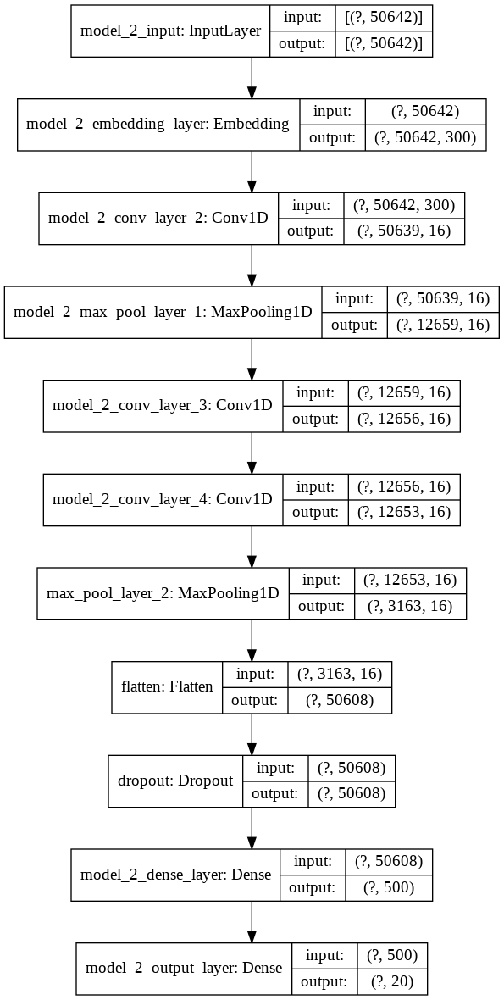

In [ ]:
tf.keras.utils.plot_model(
    model, to_file='model_2.png', show_shapes=True, show_layer_names=True,
    rankdir='TB', expand_nested=False, dpi=96
)

## Screenshots of the scalars of model 2

<a href='https://drive.google.com/file/d/1TPAGC-OtdIkt3GReZNB9tzlgT9fXFlmD/view?usp=sharing'>Epoch_Accuracy</a>

<a href='https://drive.google.com/file/d/1pLPxBuCrVSzUvO8jb6yosEXeMZDqyl31/view?usp=sharing'>Epoch_Loss</a>

## Some screenshot of histograms of model 2

<a href='https://drive.google.com/file/d/1r9NPpF4WT6WnZWJQfN_DldCVMaEfag-9/view?usp=sharing'>screenshot_1</a>

<a href='https://drive.google.com/file/d/172D3enDlmws5Byif_Yr1jecy-kibBnQD/view?usp=sharing'>screenshot_2</a>

<a href='https://drive.google.com/file/d/1UwgawnLoISUthsx_g3YlWIsoD7cIdymN/view?usp=sharing'>screenshot_3</a>

<a href='https://drive.google.com/file/d/17F-Vd921m9ZLAJoh7L0tnvxEqmfMJQmE/view?usp=sharing'>screenshot_4</a>